# Preprocessing & Training
## Predicting Rates of Chronic Absenteeism

In this notebook we are adding 4 additional time series features:
- the difference between each value's '% Chronically Absent' and the 5 year averages of '% Chronically Absent'  (grouped by DBN, Grade, & Demographic Variable)
- the difference between each value's '% Attendance' and the 5 year averages of '% Chronically Absent'  (grouped by DBN, Grade, & Demographic Variable)
- the difference between each value's '% Chronically Absent' and the 2 year averages of '% Chronically Absent'  (grouped by DBN, Grade, & Demographic Variable)
- the difference between each value's '% Attendance' and the 2 year averages of '% Chronically Absent'  (grouped by DBN, Grade, & Demographic Variable)

As both '% Chronically Absent' and '% Attendance' are variables that had high feature importance (see notebook 1.3.1) and we wanted to build in additional features that may help with a model's predictive power. The addition of the variables led to around 0.6% improvement in accuracy scores across initial models.

### Imports 

In [1]:
import pandas as pd
import numpy as np
import os
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import __version__ as sklearn_version
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
from sklearn.model_selection import train_test_split, cross_validate, GridSearchCV, learning_curve, TimeSeriesSplit
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, confusion_matrix
from sklearn.pipeline import make_pipeline
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.tree import DecisionTreeClassifier 
import datetime
from pandas_profiling import ProfileReport

from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import cross_val_score
from scipy.stats import randint
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import RandomizedSearchCV
import matplotlib.style as style
style.use('fivethirtyeight')

In [2]:
#load data
path= '/Users/josephfrasca/Coding_Stuff/Springboard/Capstone_3/Capstone_3/data/interim'
os.chdir(path)

In [3]:
attendance = pd.read_csv('attendance_with_nextYear.csv')
attendance.head()

,DBN,School Name,Grade,Year,Demographic Category,Demographic Variable,# Total Days,# Days Absent,# Days Present,% Attendance,# Contributing 20+ Total Days,# Chronically Absent,% Chronically Absent,Next Year % Chronically Absent
0,01M015,P.S. 015 Roberto Clemente,All Grades,2013-14,All Students,All Students,34803,2783.0,32020.0,92.0,216.0,58.0,26.9,23.4
1,01M015,P.S. 015 Roberto Clemente,PK in K-12 Schools,2013-14,All Students,All Students,4711,560.0,4151.0,88.1,30.0,16.0,53.3,65.2
2,01M015,P.S. 015 Roberto Clemente,0K,2013-14,All Students,All Students,7073,659.0,6414.0,90.7,44.0,13.0,29.5,30.0
3,01M015,P.S. 015 Roberto Clemente,1,2013-14,All Students,All Students,6739,525.0,6214.0,92.2,42.0,13.0,31.0,18.8
4,01M015,P.S. 015 Roberto Clemente,2,2013-14,All Students,All Students,3988,308.0,3680.0,92.3,25.0,5.0,20.0,21.9


In [4]:
#drop highly correlated variables idenfiied in EDA, retained variables that make the model more generalizable 
    #as the remaining values more schools would have data on

#drop # Total Days and #Contributing 20+ Total Days (are highly correlated with # Days Present)
#drop #Chronically Absent (is highly correlated with # Days Absent)
#Drop Demographic Category as Demographic Variable contains all this information and they are highly correlated
attendance = attendance.drop(columns=['# Contributing 20+ Total Days','# Total Days', '# Chronically Absent', 'Demographic Category',])
attendance.head()

,DBN,School Name,Grade,Year,Demographic Variable,# Days Absent,# Days Present,% Attendance,% Chronically Absent,Next Year % Chronically Absent
0,01M015,P.S. 015 Roberto Clemente,All Grades,2013-14,All Students,2783.0,32020.0,92.0,26.9,23.4
1,01M015,P.S. 015 Roberto Clemente,PK in K-12 Schools,2013-14,All Students,560.0,4151.0,88.1,53.3,65.2
2,01M015,P.S. 015 Roberto Clemente,0K,2013-14,All Students,659.0,6414.0,90.7,29.5,30.0
3,01M015,P.S. 015 Roberto Clemente,1,2013-14,All Students,525.0,6214.0,92.2,31.0,18.8
4,01M015,P.S. 015 Roberto Clemente,2,2013-14,All Students,308.0,3680.0,92.3,20.0,21.9


In [5]:
#defined mean and std deviation of target variable
std = np.std(attendance['Next Year % Chronically Absent'])
mean = np.mean(attendance['Next Year % Chronically Absent'])

print('mean:',mean)
print('std:',std)

mean: 27.376079840339223
std: 17.703076424476684


In [6]:
#Turn chronic absenteeism into categorical variable
    #High = 1 stand deviations above mean
    #Med = +/- 1 std from mean
    #Low = 1 std dev below mean
    
# defining function to check next year Chronic Absenteesim Rates
def fun(num): 
  
    if num< (mean - std): 
        return "Low"
  
    elif num>= (mean - std) and num <= (mean + std): 
        return "Medium"
    
    elif num > (mean+ std):
        return "High"
  
    else: 
        return np.nan

In [7]:
# passing function to apply and storing returned series as new column
attendance['Chronically_Absent_Next_Year'] = attendance['Next Year % Chronically Absent'].apply(fun) 

In [8]:
#check NaNs in data set, look this subset by year 
#for NaNs pre 2018-19 ...(are these schools that closed??)
check_nans = attendance[attendance['Next Year % Chronically Absent'].isnull() == True]
check_nans['Year'].value_counts()/len(check_nans)*100

2018-19    68.677238
2013-14     6.433159
2016-17     6.327445
2017-18     6.304697
2014-15     6.239128
2015-16     6.018333
Name: Year, dtype: float64

In [9]:
#define functions to get NaNs as % 
def NaNs_as_percent(dataframe):
    '''show % NaNs for each column'''
    print(dataframe.isna().sum()/len(dataframe)*100)

In [10]:
NaNs_as_percent(attendance)

DBN                                0.000000
School Name                        0.000000
Grade                              0.000000
Year                               0.000000
Demographic Variable               0.000000
# Days Absent                      0.000000
# Days Present                     0.000000
% Attendance                       0.000000
% Chronically Absent               0.000000
Next Year % Chronically Absent    24.768982
Chronically_Absent_Next_Year      24.768982
dtype: float64


In [11]:
#check value counts by year
check_nans.Year.value_counts()/len(check_nans.Year)*100

2018-19    68.677238
2013-14     6.433159
2016-17     6.327445
2017-18     6.304697
2014-15     6.239128
2015-16     6.018333
Name: Year, dtype: float64

In [12]:
#examine one year besides 2018-19 (which was the expected)
check_nans[check_nans.Year == '2013-14'].head()

,DBN,School Name,Grade,Year,Demographic Variable,# Days Absent,# Days Present,% Attendance,% Chronically Absent,Next Year % Chronically Absent,Chronically_Absent_Next_Year
126,01M301,"Technology, Arts, and Sciences Studio",7,2013-14,All Students,944.0,8451.0,90.0,37.0,NaN,NaN
142,01M345,"Collaborative Academy of Science, Technology, ...",7,2013-14,All Students,960.0,11258.0,92.1,30.1,NaN,NaN
320,02M104,J.H.S. 104 Simon Baruch,8,2013-14,All Students,3020.0,63922.0,95.5,12.2,NaN,NaN
329,02M111,P.S. 111 Adolph S. Ochs,6,2013-14,All Students,801.0,9631.0,92.3,29.5,NaN,NaN
352,02M126,P.S. 126 Jacob August Riis,PK in K-12 Schools,2013-14,All Students,727.0,7999.0,91.7,25.5,NaN,NaN


In [13]:
#check percent of data that has NaNs not in the expected year of 2018-19
print(len(check_nans[check_nans.Year != '2018-19'])/len(attendance)*100)
print(len(attendance))

7.758329245495645
603416


It seems that the NaNs in `Next Year % Chronically Absent` aren't just in 2018-19 as expected. There are around 6% of data each year that does not have next year's data. Some of the schools I looked into were closed or had name changes. This could possibly be due to inconsistent naming of the schools year to year led to a calculation error for `Next Year % Chronically Absent` or these school did not have data for that subset of students the following year. I will have to dig further into why this may be occuring. This makes up around 7.8% of data.

## Feature Creation

In [14]:
attendance.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 603416 entries, 0 to 603415
Data columns (total 11 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   DBN                             603416 non-null  object 
 1   School Name                     603416 non-null  object 
 2   Grade                           603416 non-null  object 
 3   Year                            603416 non-null  object 
 4   Demographic Variable            603416 non-null  object 
 5   # Days Absent                   603416 non-null  float64
 6   # Days Present                  603416 non-null  float64
 7   % Attendance                    603416 non-null  float64
 8   % Chronically Absent            603416 non-null  float64
 9   Next Year % Chronically Absent  453956 non-null  float64
 10  Chronically_Absent_Next_Year    453956 non-null  object 
dtypes: float64(5), object(6)
memory usage: 50.6+ MB


Currently there are several categorical variables - over 1600 unique schools, 15 grades, 6 years and 14 demographic variables).


To deal with DBN (District Borough Number) and School Name we will split DBN into it's 3 components see [explanation of DBN](https://teachnyc.zendesk.com/hc/en-us/articles/360053601831-What-is-a-DBN-District-Borough-Number-) here. They are: District Number, Borough Code, and School Number. Then we can retain district number and borough code while droping school number, and borough code. This will make our dummy variables more manageable and our model more generalizable to a school's location. See image of DBM from linked website.

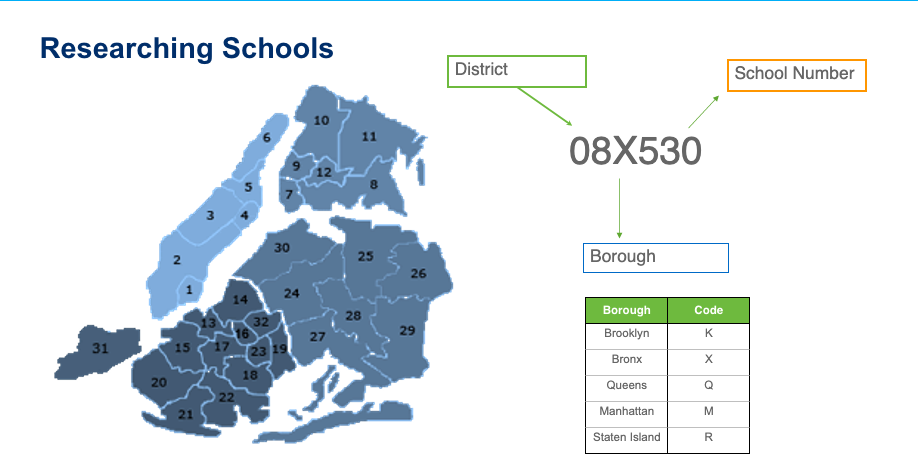

In [15]:
#split DBN into it's 3 components, creating column for each: District Number, Borough Code, School Number
attendance['District_Number'] = attendance.DBN.astype(str).str[:2]
attendance['Borough_Code'] = attendance.DBN.astype(str).str[2]
attendance['School_Number'] = attendance.DBN.astype(str).str[3:]
attendance.head()

,DBN,School Name,Grade,Year,Demographic Variable,# Days Absent,# Days Present,% Attendance,% Chronically Absent,Next Year % Chronically Absent,Chronically_Absent_Next_Year,District_Number,Borough_Code,School_Number
0,01M015,P.S. 015 Roberto Clemente,All Grades,2013-14,All Students,2783.0,32020.0,92.0,26.9,23.4,Medium,01,M,015
1,01M015,P.S. 015 Roberto Clemente,PK in K-12 Schools,2013-14,All Students,560.0,4151.0,88.1,53.3,65.2,High,01,M,015
2,01M015,P.S. 015 Roberto Clemente,0K,2013-14,All Students,659.0,6414.0,90.7,29.5,30.0,Medium,01,M,015
3,01M015,P.S. 015 Roberto Clemente,1,2013-14,All Students,525.0,6214.0,92.2,31.0,18.8,Medium,01,M,015
4,01M015,P.S. 015 Roberto Clemente,2,2013-14,All Students,308.0,3680.0,92.3,20.0,21.9,Medium,01,M,015


In [16]:
#create more user friendly District Code column
def turn_friendly(code): 
  
    if code == 'K': 
        return "Brooklyn"
  
    elif code == 'X':
        return "Bronx"
    
    elif code == 'Q':
        return "Queens"
    
    elif code == 'M':
        return "Manhattan"
    
    elif code == 'R':
        return "Staten Island"
  
    else: 
        return "Error"

In [17]:
#passing function to apply and storing returned series as new column
attendance['Borough_Name'] = attendance['Borough_Code'].apply(turn_friendly) 
attendance.Borough_Name.value_counts()

Brooklyn         178769
Queens           148530
Bronx            133381
Manhattan        110824
Staten Island     31912
Name: Borough_Name, dtype: int64

In [18]:
#get five year averages by DBN, Grade, & Demographic Variable
yrs = ['2013-14', '2014-15', '2015-16', '2016-17', '2017-18']
attendance_2013_2018 = attendance[attendance.Year.isin(yrs)]
five_year_avgs = attendance_2013_2018.groupby(by=['DBN', 'Grade', 'Demographic Variable']).mean().reset_index()

In [19]:
attendance.Year.unique()

array(['2013-14', '2014-15', '2015-16', '2016-17', '2017-18', '2018-19'],
      dtype=object)

In [20]:
#get last 2 year averages by DBN, Grade, & Demographic Variable
options = ['2016-17', '2017-18']
attendance_2016_18 = attendance[attendance.Year.isin(options)]
two_year_avgs = attendance_2016_18.groupby(by=['DBN', 'Grade', 'Demographic Variable']).mean().reset_index()

In [21]:
#add 2 year averages (by DBN, Grade, & Demographic Variable) of '% Chronically Absent' and '% Attendance'
attendance2 = pd.merge(attendance, two_year_avgs.drop(columns=['Next Year % Chronically Absent', '# Days Present', '# Days Absent']), how='left', on=['DBN', 'Grade', 'Demographic Variable'], suffixes=('', '_2_yr_avg'))
NaNs_as_percent(attendance2)
#attendance2[attendance2['% Attendance_2_yr_avg'].isnull() == True].Year.unique()

DBN                                0.000000
School Name                        0.000000
Grade                              0.000000
Year                               0.000000
Demographic Variable               0.000000
# Days Absent                      0.000000
# Days Present                     0.000000
% Attendance                       0.000000
% Chronically Absent               0.000000
Next Year % Chronically Absent    24.768982
Chronically_Absent_Next_Year      24.768982
District_Number                    0.000000
Borough_Code                       0.000000
School_Number                      0.000000
Borough_Name                       0.000000
% Attendance_2_yr_avg              3.339487
% Chronically Absent_2_yr_avg      3.339487
dtype: float64


Seems we are missing data from schools that don't have data in '2016-17' AND '2017-18'

In [22]:
#add 5 year averages (by DBN, Grade, & Demographic Variable) of '% Chronically Absent' and '% Attendance'
attendance = pd.merge(attendance2, five_year_avgs.drop(columns=['Next Year % Chronically Absent', '# Days Present', '# Days Absent']), how='left', on=['DBN', 'Grade', 'Demographic Variable'], suffixes=('', '_5_yr_avg'))
#NaNs_as_percent(attendance)
#attendance[attendance['% Attendance_5_yr_avg'].isnull() == True].Year.unique()
attendance

,DBN,School Name,Grade,Year,Demographic Variable,# Days Absent,# Days Present,% Attendance,% Chronically Absent,Next Year % Chronically Absent,Chronically_Absent_Next_Year,District_Number,Borough_Code,School_Number,Borough_Name,% Attendance_2_yr_avg,% Chronically Absent_2_yr_avg,% Attendance_5_yr_avg,% Chronically Absent_5_yr_avg
0,01M015,P.S. 015 Roberto Clemente,All Grades,2013-14,All Students,2783.0,32020.0,92.0,26.9,23.4,Medium,01,M,015,Manhattan,93.65,21.95,93.060000,24.320000
1,01M015,P.S. 015 Roberto Clemente,PK in K-12 Schools,2013-14,All Students,560.0,4151.0,88.1,53.3,65.2,High,01,M,015,Manhattan,92.60,22.20,88.775000,47.675000
2,01M015,P.S. 015 Roberto Clemente,0K,2013-14,All Students,659.0,6414.0,90.7,29.5,30.0,Medium,01,M,015,Manhattan,92.55,30.45,91.720000,30.560000
3,01M015,P.S. 015 Roberto Clemente,1,2013-14,All Students,525.0,6214.0,92.2,31.0,18.8,Medium,01,M,015,Manhattan,93.95,16.45,93.160000,25.640000
4,01M015,P.S. 015 Roberto Clemente,2,2013-14,All Students,308.0,3680.0,92.3,20.0,21.9,Medium,01,M,015,Manhattan,93.75,20.60,93.620000,19.540000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
603411,75X811,P.S. X811,10,2018-19,Not ELL,1899.0,10105.0,84.2,52.8,NaN,NaN,75,X,811,Bronx,85.90,45.20,85.333333,48.733333
603412,75X811,P.S. X811,11,2018-19,ELL,1071.0,4239.0,79.8,66.7,NaN,NaN,75,X,811,Bronx,84.90,61.90,86.600000,53.666667
603413,75X811,P.S. X811,11,2018-19,Not ELL,1359.0,8382.0,86.0,55.2,NaN,NaN,75,X,811,Bronx,82.90,53.50,83.033333,51.300000
603414,75X811,P.S. X811,12,2018-19,ELL,4837.0,20073.0,80.6,66.7,NaN,NaN,75,X,811,Bronx,82.55,62.65,82.880000,63.720000


Missing data for rows that didn't have Chronic Absenteeism/Attendance data for 2018-19.

In [23]:
#create columns for each variables difference from the 5&2 year avgs
#of % Chronically Absent & % Attendance
attendance['% Attendance - diff from 5 yr avg'] = attendance['% Attendance'] - attendance['% Attendance_5_yr_avg'] 
attendance['% Attendance - diff from 2 yr avg'] = attendance['% Attendance'] - attendance['% Attendance_2_yr_avg'] 
attendance['% Chronically Absent - diff from 5 yr avg'] = attendance['% Chronically Absent'] - attendance['% Chronically Absent_5_yr_avg']  
attendance['% Chronically Absent - diff from 2 yr avg'] = attendance['% Chronically Absent'] - attendance['% Chronically Absent_2_yr_avg'] 
attendance

,DBN,School Name,Grade,Year,Demographic Variable,# Days Absent,# Days Present,% Attendance,% Chronically Absent,Next Year % Chronically Absent,...,School_Number,Borough_Name,% Attendance_2_yr_avg,% Chronically Absent_2_yr_avg,% Attendance_5_yr_avg,% Chronically Absent_5_yr_avg,% Attendance - diff from 5 yr avg,% Attendance - diff from 2 yr avg,% Chronically Absent - diff from 5 yr avg,% Chronically Absent - diff from 2 yr avg
0,01M015,P.S. 015 Roberto Clemente,All Grades,2013-14,All Students,2783.0,32020.0,92.0,26.9,23.4,...,015,Manhattan,93.65,21.95,93.060000,24.320000,-1.060000,-1.65,2.580000,4.95
1,01M015,P.S. 015 Roberto Clemente,PK in K-12 Schools,2013-14,All Students,560.0,4151.0,88.1,53.3,65.2,...,015,Manhattan,92.60,22.20,88.775000,47.675000,-0.675000,-4.50,5.625000,31.10
2,01M015,P.S. 015 Roberto Clemente,0K,2013-14,All Students,659.0,6414.0,90.7,29.5,30.0,...,015,Manhattan,92.55,30.45,91.720000,30.560000,-1.020000,-1.85,-1.060000,-0.95
3,01M015,P.S. 015 Roberto Clemente,1,2013-14,All Students,525.0,6214.0,92.2,31.0,18.8,...,015,Manhattan,93.95,16.45,93.160000,25.640000,-0.960000,-1.75,5.360000,14.55
4,01M015,P.S. 015 Roberto Clemente,2,2013-14,All Students,308.0,3680.0,92.3,20.0,21.9,...,015,Manhattan,93.75,20.60,93.620000,19.540000,-1.320000,-1.45,0.460000,-0.60
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
603411,75X811,P.S. X811,10,2018-19,Not ELL,1899.0,10105.0,84.2,52.8,NaN,...,811,Bronx,85.90,45.20,85.333333,48.733333,-1.133333,-1.70,4.066667,7.60
603412,75X811,P.S. X811,11,2018-19,ELL,1071.0,4239.0,79.8,66.7,NaN,...,811,Bronx,84.90,61.90,86.600000,53.666667,-6.800000,-5.10,13.033333,4.80
603413,75X811,P.S. X811,11,2018-19,Not ELL,1359.0,8382.0,86.0,55.2,NaN,...,811,Bronx,82.90,53.50,83.033333,51.300000,2.966667,3.10,3.900000,1.70
603414,75X811,P.S. X811,12,2018-19,ELL,4837.0,20073.0,80.6,66.7,NaN,...,811,Bronx,82.55,62.65,82.880000,63.720000,-2.280000,-1.95,2.980000,4.05


In [24]:
attendance = attendance.drop(columns=['% Attendance_2_yr_avg', '% Chronically Absent_2_yr_avg', '% Attendance_5_yr_avg', '% Chronically Absent_5_yr_avg'])
attendance

,DBN,School Name,Grade,Year,Demographic Variable,# Days Absent,# Days Present,% Attendance,% Chronically Absent,Next Year % Chronically Absent,Chronically_Absent_Next_Year,District_Number,Borough_Code,School_Number,Borough_Name,% Attendance - diff from 5 yr avg,% Attendance - diff from 2 yr avg,% Chronically Absent - diff from 5 yr avg,% Chronically Absent - diff from 2 yr avg
0,01M015,P.S. 015 Roberto Clemente,All Grades,2013-14,All Students,2783.0,32020.0,92.0,26.9,23.4,Medium,01,M,015,Manhattan,-1.060000,-1.65,2.580000,4.95
1,01M015,P.S. 015 Roberto Clemente,PK in K-12 Schools,2013-14,All Students,560.0,4151.0,88.1,53.3,65.2,High,01,M,015,Manhattan,-0.675000,-4.50,5.625000,31.10
2,01M015,P.S. 015 Roberto Clemente,0K,2013-14,All Students,659.0,6414.0,90.7,29.5,30.0,Medium,01,M,015,Manhattan,-1.020000,-1.85,-1.060000,-0.95
3,01M015,P.S. 015 Roberto Clemente,1,2013-14,All Students,525.0,6214.0,92.2,31.0,18.8,Medium,01,M,015,Manhattan,-0.960000,-1.75,5.360000,14.55
4,01M015,P.S. 015 Roberto Clemente,2,2013-14,All Students,308.0,3680.0,92.3,20.0,21.9,Medium,01,M,015,Manhattan,-1.320000,-1.45,0.460000,-0.60
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
603411,75X811,P.S. X811,10,2018-19,Not ELL,1899.0,10105.0,84.2,52.8,NaN,NaN,75,X,811,Bronx,-1.133333,-1.70,4.066667,7.60
603412,75X811,P.S. X811,11,2018-19,ELL,1071.0,4239.0,79.8,66.7,NaN,NaN,75,X,811,Bronx,-6.800000,-5.10,13.033333,4.80
603413,75X811,P.S. X811,11,2018-19,Not ELL,1359.0,8382.0,86.0,55.2,NaN,NaN,75,X,811,Bronx,2.966667,3.10,3.900000,1.70
603414,75X811,P.S. X811,12,2018-19,ELL,4837.0,20073.0,80.6,66.7,NaN,NaN,75,X,811,Bronx,-2.280000,-1.95,2.980000,4.05


### Quick EDA of new variables

In [25]:
def see_target_interactions(dataframe, target_variable):
    '''vizualize scatterplot to see interaction between target variable and each variable'''
    for col in dataframe.columns:
        sns.scatterplot(x=col, y=target_variable, data=dataframe)
        plt.show()

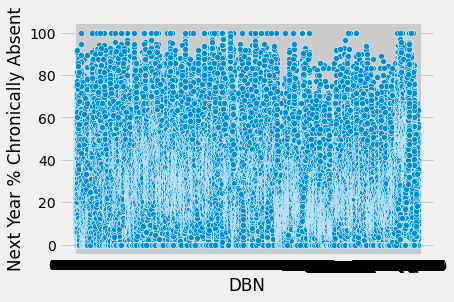

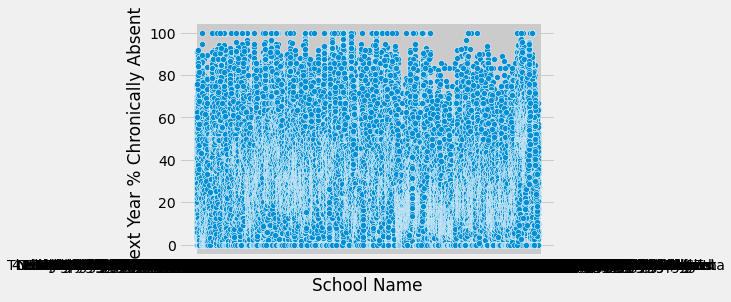

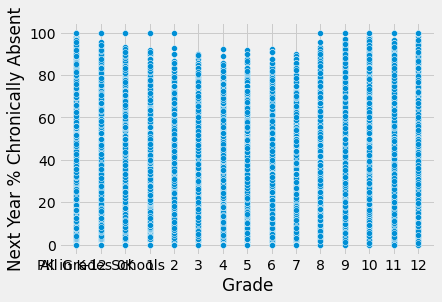

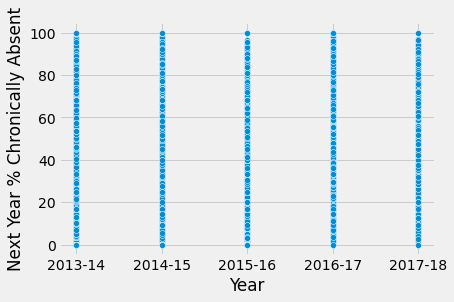

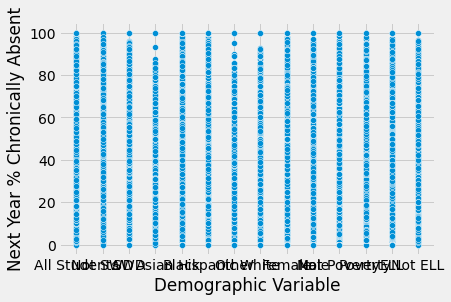

...

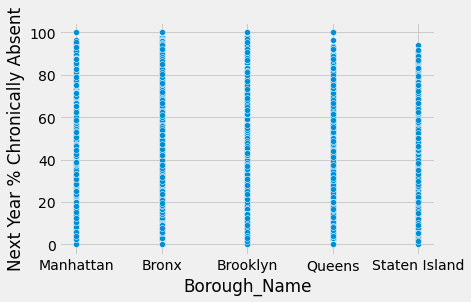

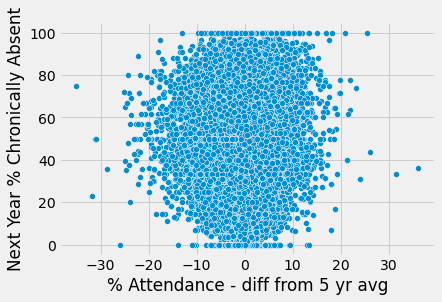

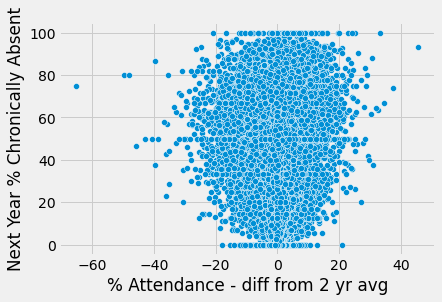

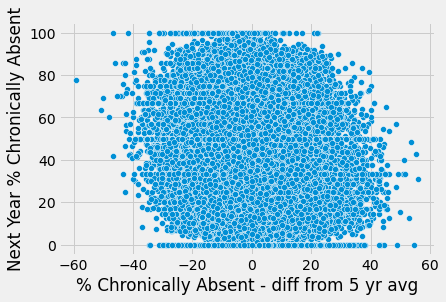

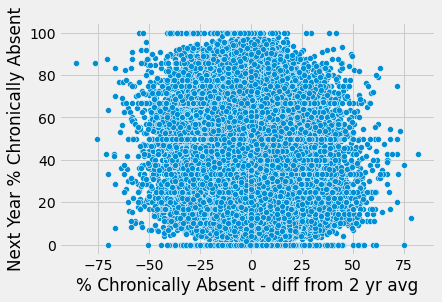

In [26]:
#get scatterplot for all interactions with target variable
see_target_interactions(attendance, 'Next Year % Chronically Absent')

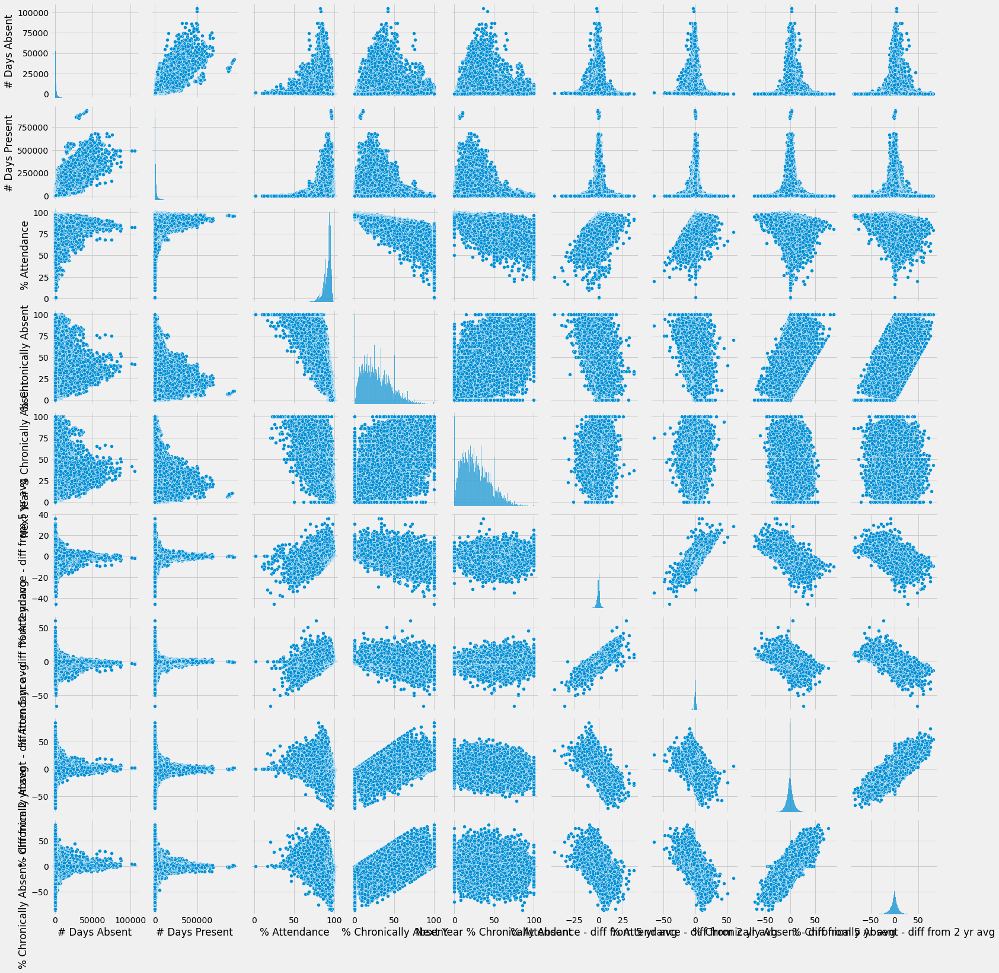

In [28]:
#scatter plot of each numeric variable with all other numeric variable 
sns.pairplot(attendance)

In [29]:
#build pandas profiling for quick EDA
profile = ProfileReport(attendance)
profile

In [30]:
#save pandas profiling report available, or if the widget state was not saved in the notebook. You may be able to create the widget by running the appropriate cells.
os.chdir('/Users/josephfrasca/Coding_Stuff/Springboard/Capstone_3/Capstone_3/reports')
profile.to_file("notebook-1.2.1-attendance_more_variables_EDA.html")

<AxesSubplot:xlabel='District_Number', ylabel='Next Year % Chronically Absent'>

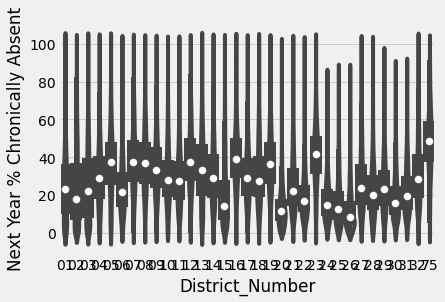

In [31]:
#MAKE VIOLIN PLOTS OF new CATEGORICAL VALUES VS TARGET VARIABLE 
#lots of variation by district
sns.violinplot(x='District_Number', y='Next Year % Chronically Absent', data=attendance)

<AxesSubplot:xlabel='Borough_Name', ylabel='Next Year % Chronically Absent'>

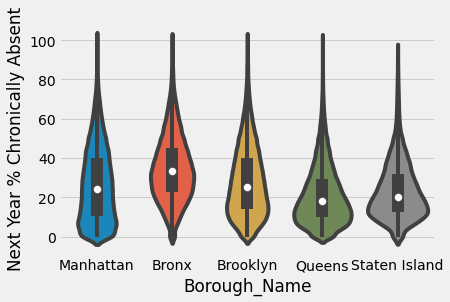

In [32]:
#Queens and Staten Island have the lowest rates of chronically absent students
#followed by Manhattan and then Brooklyn (have larger ranges than the others)
#Bronx has the highest, and seems to be more normally distributed than the others
sns.violinplot(x='Borough_Name', y='Next Year % Chronically Absent', data=attendance)

In [33]:
attendance.describe()

,# Days Absent,# Days Present,% Attendance,% Chronically Absent,Next Year % Chronically Absent,% Attendance - diff from 5 yr avg,% Attendance - diff from 2 yr avg,% Chronically Absent - diff from 5 yr avg,% Chronically Absent - diff from 2 yr avg
count,603416.000000,603416.000000,603416.000000,603416.000000,453956.000000,600910.000000,583265.000000,600910.000000,583265.000000
mean,1495.260260,16902.322214,91.293766,27.720952,27.376080,-0.032801,0.086309,0.264527,-0.496585
std,2873.307826,30097.539480,5.341074,18.062075,17.703096,2.020598,2.397005,7.828970,9.201864
min,0.000000,8.000000,0.700000,0.000000,0.000000,-45.760000,-65.150000,-71.400000,-85.700000
25%,299.000000,3680.000000,89.400000,13.500000,13.300000,-0.740000,-0.650000,-3.640000,-4.600000
50%,647.000000,8017.000000,92.600000,25.000000,25.000000,0.000000,0.050000,0.000000,-0.150000
75%,1425.000000,16040.250000,94.700000,39.400000,38.900000,0.740000,0.900000,4.000000,3.450000
max,105055.000000,934266.000000,100.000000,100.000000,100.000000,36.280000,60.800000,85.700000,81.950000


### Feature Selection 

In [34]:
attendance.columns

Index(['DBN', 'School Name', 'Grade', 'Year', 'Demographic Variable',
       '# Days Absent', '# Days Present', '% Attendance',
       '% Chronically Absent', 'Next Year % Chronically Absent',
       'Chronically_Absent_Next_Year', 'District_Number', 'Borough_Code',
       'School_Number', 'Borough_Name', '% Attendance - diff from 5 yr avg',
       '% Attendance - diff from 2 yr avg',
       '% Chronically Absent - diff from 5 yr avg',
       '% Chronically Absent - diff from 2 yr avg'],
      dtype='object')

In [35]:
#save data set for using labels with model predictions
attendance.to_csv(r'/Users/josephfrasca/Coding_Stuff/Springboard/Capstone_3/Capstone_3/data/interim/attendance_for_final_labels.csv', index=False)

In [36]:
#drop DBN, school name, and school number for dummy variables
attendance = attendance.drop(columns=['DBN', 'School Name', 'School_Number'])

#drop Borough Code/Name because it is highly correlated with District Number, and District Number has more info
#district Number also has more correlation with target variable
attendance = attendance.drop(columns=['Borough_Code', 'Borough_Name'])

#drop COLUMNS (# days absent, # days present) because ''% attendance' column has this info 
#and we don't have these variables in current daily data from NYC OpenData
attendance = attendance.drop(columns=['# Days Absent', '# Days Present'])

In [37]:
#separate 2018-2019 data from 2013-18 school years for later predicting
attendance_2018_19 = attendance[attendance.Year == '2018-19'].index
print(attendance.shape)
print(attendance_2018_19.shape)
attendance_2013_18 = attendance.drop(attendance_2018_19)
print(attendance_2013_18.shape)

(603416, 12)
(102645,)
(500771, 12)


In [38]:
attendance.dtypes

Grade                                         object
Year                                          object
Demographic Variable                          object
% Attendance                                 float64
% Chronically Absent                         float64
Next Year % Chronically Absent               float64
Chronically_Absent_Next_Year                  object
District_Number                               object
% Attendance - diff from 5 yr avg            float64
% Attendance - diff from 2 yr avg            float64
% Chronically Absent - diff from 5 yr avg    float64
% Chronically Absent - diff from 2 yr avg    float64
dtype: object

In [39]:
attendance['District_Number'].unique()

array(['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11',
       '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22',
       '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '75'],
      dtype=object)

In [40]:
#separate 2018-2019 data
attendance_2018_2019 = attendance[attendance.Year == '2018-19']
attendance_2018_2019

,Grade,Year,Demographic Variable,% Attendance,% Chronically Absent,Next Year % Chronically Absent,Chronically_Absent_Next_Year,District_Number,% Attendance - diff from 5 yr avg,% Attendance - diff from 2 yr avg,% Chronically Absent - diff from 5 yr avg,% Chronically Absent - diff from 2 yr avg
500771,All Grades,2018-19,All Students,92.6,24.2,NaN,NaN,01,-0.460000,-1.05,-0.120000,2.25
500772,PK in K-12 Schools,2018-19,All Students,88.4,50.0,NaN,NaN,01,-0.375000,-4.20,2.325000,27.80
500773,0K,2018-19,All Students,91.9,28.6,NaN,NaN,01,0.180000,-0.65,-1.960000,-1.85
500774,1,2018-19,All Students,90.7,28.6,NaN,NaN,01,-2.460000,-3.25,2.960000,12.15
500775,2,2018-19,All Students,94.0,11.8,NaN,NaN,01,0.380000,0.25,-7.740000,-8.80
...,...,...,...,...,...,...,...,...,...,...,...,...
603411,10,2018-19,Not ELL,84.2,52.8,NaN,NaN,75,-1.133333,-1.70,4.066667,7.60
603412,11,2018-19,ELL,79.8,66.7,NaN,NaN,75,-6.800000,-5.10,13.033333,4.80
603413,11,2018-19,Not ELL,86.0,55.2,NaN,NaN,75,2.966667,3.10,3.900000,1.70
603414,12,2018-19,ELL,80.6,66.7,NaN,NaN,75,-2.280000,-1.95,2.980000,4.05


In [41]:
#check if this was sucessful
attendance_2013_18.Year.value_counts()

2017-18    102496
2016-17    102411
2015-16    100911
2014-15     98739
2013-14     96214
Name: Year, dtype: int64

In [42]:
#check NaNs in resulting dataframe
NaNs_as_percent(attendance_2013_18)

Grade                                        0.000000
Year                                         0.000000
Demographic Variable                         0.000000
% Attendance                                 0.000000
% Chronically Absent                         0.000000
Next Year % Chronically Absent               9.348584
Chronically_Absent_Next_Year                 9.348584
District_Number                              0.000000
% Attendance - diff from 5 yr avg            0.000000
% Attendance - diff from 2 yr avg            3.068269
% Chronically Absent - diff from 5 yr avg    0.000000
% Chronically Absent - diff from 2 yr avg    3.068269
dtype: float64


In [43]:
#for now, will drop these NaNs until further research is conducted
attendance_2013_18 = attendance_2013_18.dropna()
NaNs_as_percent(attendance_2013_18)

Grade                                        0.0
Year                                         0.0
Demographic Variable                         0.0
% Attendance                                 0.0
% Chronically Absent                         0.0
Next Year % Chronically Absent               0.0
Chronically_Absent_Next_Year                 0.0
District_Number                              0.0
% Attendance - diff from 5 yr avg            0.0
% Attendance - diff from 2 yr avg            0.0
% Chronically Absent - diff from 5 yr avg    0.0
% Chronically Absent - diff from 2 yr avg    0.0
dtype: float64


In [44]:
#check dtypes
attendance_2013_18.dtypes

Grade                                         object
Year                                          object
Demographic Variable                          object
% Attendance                                 float64
% Chronically Absent                         float64
Next Year % Chronically Absent               float64
Chronically_Absent_Next_Year                  object
District_Number                               object
% Attendance - diff from 5 yr avg            float64
% Attendance - diff from 2 yr avg            float64
% Chronically Absent - diff from 5 yr avg    float64
% Chronically Absent - diff from 2 yr avg    float64
dtype: object

## Create dummy or indicator features for categorical variables

In [45]:
#create separate dataframes for regression vs. classification of target variable
attendance_2013_18_regressor = attendance_2013_18.drop(columns=['Chronically_Absent_Next_Year'])
attendance_2013_18_classifier = attendance_2013_18.drop(columns=['Next Year % Chronically Absent'])
print(attendance_2013_18_classifier.shape)
print(attendance_2013_18_regressor.shape)

(448835, 11)
(448835, 11)


In [46]:
#create dummy variables for the two data frames
dummy_attendance_2013_18_regressor = pd.get_dummies(attendance_2013_18_regressor)

#remove target variable from classification data, so it does not get turned into a dummy variable
dummy_attendance_2013_18_classifier = pd.get_dummies(attendance_2013_18_classifier.drop(columns=['Chronically_Absent_Next_Year']))

#save target variable for classification
target_classifier = attendance_2013_18['Chronically_Absent_Next_Year']

print(dummy_attendance_2013_18_classifier.shape)
print(dummy_attendance_2013_18_regressor.shape)

(448835, 73)
(448835, 74)


## Split into testing and training datasets

In [47]:
#define variables for regressor
X = dummy_attendance_2013_18_regressor.drop(columns=['Next Year % Chronically Absent'])
y = dummy_attendance_2013_18_regressor['Next Year % Chronically Absent']

In [48]:
#train test split
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

#Time series Train test split for the 5 school years years
tss = TimeSeriesSplit(n_splits = 5)
for train_index, test_index in tss.split(X):
    X_train, X_test = X.iloc[train_index, :], X.iloc[test_index,:]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

In [49]:
#check len of data with 80/20 split
len(attendance_2013_18_regressor) * .8, len(attendance_2013_18_regressor) * .2

(359068.0, 89767.0)

In [50]:
#check shape of variables
#different than what I excpted
X_train.shape, X_test.shape

((374030, 73), (74805, 73))

In [51]:
y_train.shape, y_test.shape

((374030,), (74805,))

In [52]:
#Check the `dtypes` attribute of `X_train` to verify all features are numeric
X_train.dtypes

% Attendance                                 float64
% Chronically Absent                         float64
% Attendance - diff from 5 yr avg            float64
% Attendance - diff from 2 yr avg            float64
% Chronically Absent - diff from 5 yr avg    float64
                                              ...   
District_Number_29                             uint8
District_Number_30                             uint8
District_Number_31                             uint8
District_Number_32                             uint8
District_Number_75                             uint8
Length: 73, dtype: object

In [53]:
#repeat for xtest
X_test.dtypes

% Attendance                                 float64
% Chronically Absent                         float64
% Attendance - diff from 5 yr avg            float64
% Attendance - diff from 2 yr avg            float64
% Chronically Absent - diff from 5 yr avg    float64
                                              ...   
District_Number_29                             uint8
District_Number_30                             uint8
District_Number_31                             uint8
District_Number_32                             uint8
District_Number_75                             uint8
Length: 73, dtype: object

## Standardize the magnitude of numeric features using a scaler

In [54]:
#not doing because don't need to scale the numeric variables (only go 0-100) or dummy variables

#PCA check/cluster schools? (LOOK AT GUIDED CAPSTONE EDA?)
#rememeber to note about outliers (see notes in 1.1 EDA notebook)

# Modeling

### Initial Benchmark - Dummy Regressor

In [55]:
#Calculate the mean of `y_train`
train_mean = y_train.mean()
train_mean

27.21280218164166

In [56]:
#Fit the dummy regressor on the training data
#Then print the object's `constant_` attribute and verify it's the same as the mean above
dumb_reg = DummyRegressor(strategy='mean')
dumb_reg.fit(X_train, y_train)
dumb_reg.constant_

array([[27.21280218]])

In [57]:
#create dummy regressor predictions 
y_tr_pred = dumb_reg.predict(X_train)
#Make prediction with the single value of the (training) mean.
y_te_pred = train_mean * np.ones(len(y_test))
r2_score(y_train, y_tr_pred), r2_score(y_test, y_te_pred)

(0.0, -0.0005831117430672439)

In [58]:
#establish baseline for mean absolute error and mean square error 
print('MAEs:', mean_absolute_error(y_train, y_tr_pred), mean_absolute_error(y_test, y_te_pred))
print('MSEs:', mean_squared_error(y_train, y_tr_pred), mean_squared_error(y_test, y_te_pred))

MAEs: 14.361915323332243 14.382009098561001
MSEs: 310.3901297704286 311.36238137096603


### Linear Regression Model

In [59]:
lm = LinearRegression().fit(X_train, y_train)

In [60]:
#Make predictions using the model on both train and test splits
y_tr_pred = lm.predict(X_train)
y_te_pred = lm.predict(X_test)

In [61]:
#Assess model performance
# r^2 - train, test
r2 = r2_score(y_train, y_tr_pred), r2_score(y_test, y_te_pred)
print('r2:', r2)

r2: (0.8471500184069869, 0.6862644611701348)


In [62]:
#MAE - train, test
mae = mean_absolute_error(y_train, y_tr_pred), mean_absolute_error(y_test, y_te_pred)
print('mae:', mae)

mae: (4.894471709440569, 7.115208188914876)


In [63]:
# MSE - train, test
mse = mean_squared_error(y_train, y_tr_pred), mean_squared_error(y_test, y_te_pred)
print('mse:', mse)

mse: (47.443125622062944, 97.62851615654091)


## Initial Classification Models

In [64]:
#define variables for classifier
X_c = dummy_attendance_2013_18_classifier
y_c = target_classifier

In [65]:
# dividing X_c, y_c into train and test data 
#X_train, X_test, y_train, y_test = train_test_split(X_c, y_c, random_state = 0) 

#Time series Train test split for the 5 school years years
tss = TimeSeriesSplit(n_splits = 5)
for train_index, test_index in tss.split(X_c):
    X_train, X_test = X_c.iloc[train_index, :], X_c.iloc[test_index,:]
    y_train, y_test = y_c.iloc[train_index], y_c.iloc[test_index]

### Decision Tree

In [66]:
# training a DescisionTreeClassifier 
dtree_model = DecisionTreeClassifier(max_depth = 2).fit(X_train, y_train) 
dtree_predictions = dtree_model.predict(X_test) 
  
# creating a confusion matrix 
cm = confusion_matrix(y_test, dtree_predictions) 

In [67]:
print(dtree_model.score(X_test, y_test))
print(cm)

0.7697346434061895
[[ 9274    24  3682]
 [   74  7243  4692]
 [ 5532  3221 41063]]


In [68]:
print(classification_report(y_test, dtree_predictions))

              precision    recall  f1-score   support

        High       0.62      0.71      0.67     12980
         Low       0.69      0.60      0.64     12009
      Medium       0.83      0.82      0.83     49816

    accuracy                           0.77     74805
   macro avg       0.71      0.71      0.71     74805
weighted avg       0.77      0.77      0.77     74805



### K-Nearest Neighbors

In [71]:
# Create a k-NN classifier
knn = KNeighborsClassifier()

# Fit the classifier to the data
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [72]:
# Predict the labels for the training data X
y_pred = knn.predict(X_test)

In [73]:
#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.7808301584118709


In [74]:
# Generate the confusion matrix and classification report
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[ 7769    39  5172]
 [   40  7852  4117]
 [ 3121  3906 42789]]
              precision    recall  f1-score   support

        High       0.71      0.60      0.65     12980
         Low       0.67      0.65      0.66     12009
      Medium       0.82      0.86      0.84     49816

    accuracy                           0.78     74805
   macro avg       0.73      0.70      0.72     74805
weighted avg       0.78      0.78      0.78     74805



### Saved processed data

In [69]:
#save data sets 
attendance_2013_18_regressor.to_csv(r'/Users/josephfrasca/Coding_Stuff/Springboard/Capstone_3/Capstone_3/data/processed/more_variables_attendance_2013_18_regressor.csv', index=False)
attendance_2013_18_classifier.to_csv(r'/Users/josephfrasca/Coding_Stuff/Springboard/Capstone_3/Capstone_3/data/processed/more_variables_attendance_2013_18_classifier.csv', index=False)

In [70]:
#save 2018-2019 data 
#need to make drop either of the two categorical variables and then create dummy variables
attendance_2018_2019.to_csv(r'/Users/josephfrasca/Coding_Stuff/Springboard/Capstone_3/Capstone_3/data/processed/more_variables_attendance_2018_19.csv', index=False)

## Notes

**Explore Further in Future**

It seems that the NaNs in Next Year % Chronically Absent aren't just in 2018-19 as expected. There are around 6% of data each year that does not have next year's data. Some of the schools I looked into were closed or had name changes. This could possibly be due to inconsistent naming of the schools year to year led to a calculation error for Next Year % Chronically Absent or these school did not have data for that subset of students the following year. I will have to dig further into why this may be occuring. This makes up around 7.8% of data.

- gather more features, consider using data from NYC school surveys


## Summary 

- The major difference between this notebook and 1.2 is the addition of 4 new features, that was done by:
    - get five year averages by DBN, Grade, & Demographic Variable
    - get last 2 year averages by DBN, Grade, & Demographic Variable
    - added columns 2 year & 5 year averages (by DBN, Grade, & Demographic Variable) of '% Chronically Absent' and '% Attendance' to 
        - Seems we are missing 2yr avg data from schools that don't have data in '2016-17' AND '2017-18'
        - Missing data for rows that didn't have Chronic Absenteeism/Attendance data for 2018-19.
        - Not much for either missing
    - create columns for each variables difference from the 5&2 year avgs of % Chronically Absent & % Attendance

- This increased accuracy on the linear model by over 1%, decreased overall accuracy on the Decision Tree by 0.5% but increased the 'High' class f1-score by 0.6% which is the class of most interest. Also increased the KNN model accuracy by 0.7%.

- for the remaining notebook see summary in notebook 1.2 for info.